<a href="https://colab.research.google.com/github/quickgrid/taming-transformers/blob/master/scripts/taming_transformer_vqgan_autoencoder_reconstruction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Pytorch 2.0

In [1]:
!git clone https://github.com/quickgrid/taming-transformers
%cd taming-transformers

Cloning into 'taming-transformers'...
remote: Enumerating objects: 1339, done.
remote: Total 1339 (delta 0), reused 0 (delta 0), pack-reused 1339
Receiving objects: 100% (1339/1339), 409.77 MiB | 38.95 MiB/s, done.
Resolving deltas: 100% (280/280), done.
/content/taming-transformers


In [2]:
# download a VQGAN with f=16 (16x compression per spatial dimension) and with a codebook with 1024 entries
!mkdir -p logs/vqgan_imagenet_f16_1024/checkpoints
!mkdir -p logs/vqgan_imagenet_f16_1024/configs
!wget 'https://heibox.uni-heidelberg.de/f/140747ba53464f49b476/?dl=1' -O 'logs/vqgan_imagenet_f16_1024/checkpoints/last.ckpt' 
!wget 'https://heibox.uni-heidelberg.de/f/6ecf2af6c658432c8298/?dl=1' -O 'logs/vqgan_imagenet_f16_1024/configs/model.yaml' 

# download a VQGAN with f=16 (16x compression per spatial dimension) and with a larger codebook (16384 entries)
!mkdir -p logs/vqgan_imagenet_f16_16384/checkpoints
!mkdir -p logs/vqgan_imagenet_f16_16384/configs
!wget 'https://heibox.uni-heidelberg.de/f/867b05fc8c4841768640/?dl=1' -O 'logs/vqgan_imagenet_f16_16384/checkpoints/last.ckpt' 
!wget 'https://heibox.uni-heidelberg.de/f/274fb24ed38341bfa753/?dl=1' -O 'logs/vqgan_imagenet_f16_16384/configs/model.yaml' 

# download a VQGAN with f=8 (8x compression per spatial dimension) and a larger codebook-size with 8192 entries
!mkdir -p logs/vqgan_gumbel_f8/checkpoints
!mkdir -p logs/vqgan_gumbel_f8/configs
!wget 'https://heibox.uni-heidelberg.de/f/34a747d5765840b5a99d/?dl=1' -O 'logs/vqgan_gumbel_f8/checkpoints/last.ckpt' 
!wget 'https://heibox.uni-heidelberg.de/f/b24d14998a8d4f19a34f/?dl=1' -O 'logs/vqgan_gumbel_f8/configs/model.yaml'

--2023-04-12 13:09:17--  https://heibox.uni-heidelberg.de/f/140747ba53464f49b476/?dl=1
Resolving heibox.uni-heidelberg.de (heibox.uni-heidelberg.de)... 129.206.7.113
Connecting to heibox.uni-heidelberg.de (heibox.uni-heidelberg.de)|129.206.7.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://heibox.uni-heidelberg.de/seafhttp/files/d5c047ef-89a1-4b10-b110-238773301d10/last.ckpt [following]
--2023-04-12 13:09:17--  https://heibox.uni-heidelberg.de/seafhttp/files/d5c047ef-89a1-4b10-b110-238773301d10/last.ckpt
Reusing existing connection to heibox.uni-heidelberg.de:443.
HTTP request sent, awaiting response... 200 OK
Length: 957954257 (914M) [application/octet-stream]
Saving to: ‘logs/vqgan_imagenet_f16_1024/checkpoints/last.ckpt’

logs/vqgan_imagenet 100%[===================>] 913.58M  8.74MB/s    in 2m 2s   

2023-04-12 13:11:20 (7.48 MB/s) - ‘logs/vqgan_imagenet_f16_1024/checkpoints/last.ckpt’ saved [957954257/957954257]

--2023-04-12 13:11:20--  h

In [3]:
%%capture
%pip install omegaconf>=2.0.0 pytorch-lightning>=1.0.8 einops>=0.3.0
import sys
sys.path.append(".")

# also disable grad to save memory
import torch
torch.set_grad_enabled(False)

DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [5]:
%cd /content/taming-transformers

/content/taming-transformers


In [6]:
!pip install -e .

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Obtaining file:///content/taming-transformers
  Preparing metadata (setup.py) ... done
  Running setup.py develop for taming-transformers


In [8]:
!pip install deepspeed --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 765.4/765.4 kB 13.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.0/54.0 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 146.0/146.0 kB 18.3 MB/s eta 0:00:00
  Created wheel for deepspeed: filename=deepspeed-0.8.3-py3-none-any.whl size=776424 sha256=eb756f8326432d8810dd8b56d2a1abf636090eefc511a0cb5232f714ef8df7ad
  Stored in directory: /root/.cache/pip/wheels/f8/ea/8f/0768328ba436ed66f602d8d3b809624448c9eb627434176d04
Successfully built deepspeed


In [12]:
import yaml
import torch
from omegaconf import OmegaConf
from taming.models.vqgan import VQModel, GumbelVQ

def load_config(config_path, display=False):
  config = OmegaConf.load(config_path)
  if display:
    print(yaml.dump(OmegaConf.to_container(config)))
  return config

def load_vqgan(config, ckpt_path=None, is_gumbel=False):
  if is_gumbel:
    model = GumbelVQ(**config.model.params)
  else:
    model = VQModel(**config.model.params)
  if ckpt_path is not None:
    sd = torch.load(ckpt_path, map_location="cpu")["state_dict"]
    missing, unexpected = model.load_state_dict(sd, strict=False)
  return model.eval()

def preprocess_vqgan(x):
  x = 2.*x - 1.
  return x

def custom_to_pil(x):
  x = x.detach().cpu()
  x = torch.clamp(x, -1., 1.)
  x = (x + 1.)/2.
  x = x.permute(1,2,0).numpy()
  x = (255*x).astype(np.uint8)
  x = Image.fromarray(x)
  if not x.mode == "RGB":
    x = x.convert("RGB")
  return x

def reconstruct_with_vqgan(x, model):
  # could also use model(x) for reconstruction but use explicit encoding and decoding here
  z, _, [_, _, indices] = model.encode(x)
  print(f"VQGAN --- {model.__class__.__name__}: latent shape: {z.shape[2:]}")
  xrec = model.decode(z)
  return xrec

In [13]:
config1024 = load_config("logs/vqgan_imagenet_f16_1024/configs/model.yaml", display=False)
config16384 = load_config("logs/vqgan_imagenet_f16_16384/configs/model.yaml", display=False)

model1024 = load_vqgan(config1024, ckpt_path="logs/vqgan_imagenet_f16_1024/checkpoints/last.ckpt").to(DEVICE)
model16384 = load_vqgan(config16384, ckpt_path="logs/vqgan_imagenet_f16_16384/checkpoints/last.ckpt").to(DEVICE)

Working with z of shape (1, 256, 16, 16) = 65536 dimensions.


/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 237MB/s]


8.19kB [00:00, 146kB/s]                    


loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.


In [14]:
config32x32 = load_config("logs/vqgan_gumbel_f8/configs/model.yaml", display=False)
model32x32 = load_vqgan(config32x32, ckpt_path="logs/vqgan_gumbel_f8/checkpoints/last.ckpt", is_gumbel=True).to(DEVICE)

Working with z of shape (1, 256, 32, 32) = 262144 dimensions.


In [15]:
%pip install git+https://github.com/openai/DALL-E.git &> /dev/null

In [16]:
import io
import os, sys
import requests
import PIL
from PIL import Image
from PIL import ImageDraw, ImageFont
import numpy as np

import torch
import torch.nn.functional as F
import torchvision.transforms as T
import torchvision.transforms.functional as TF

from dall_e          import map_pixels, unmap_pixels, load_model
from IPython.display import display, display_markdown

font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSans-BoldItalic.ttf", 22)

def download_image(url):
    resp = requests.get(url)
    resp.raise_for_status()
    return PIL.Image.open(io.BytesIO(resp.content))


def preprocess(img, target_image_size=256, map_dalle=True):
    s = min(img.size)
    
    if s < target_image_size:
        raise ValueError(f'min dim for image {s} < {target_image_size}')
        
    r = target_image_size / s
    s = (round(r * img.size[1]), round(r * img.size[0]))
    img = TF.resize(img, s, interpolation=PIL.Image.LANCZOS)
    img = TF.center_crop(img, output_size=2 * [target_image_size])
    img = torch.unsqueeze(T.ToTensor()(img), 0)
    if map_dalle: 
      img = map_pixels(img)
    return img


def reconstruct_with_dalle(x, encoder, decoder, do_preprocess=False):
  # takes in tensor (or optionally, a PIL image) and returns a PIL image
  if do_preprocess:
    x = preprocess(x)
  z_logits = encoder(x)
  z = torch.argmax(z_logits, axis=1)
  
  print(f"DALL-E: latent shape: {z.shape}")
  z = F.one_hot(z, num_classes=encoder.vocab_size).permute(0, 3, 1, 2).float()

  x_stats = decoder(z).float()
  x_rec = unmap_pixels(torch.sigmoid(x_stats[:, :3]))
  x_rec = T.ToPILImage(mode='RGB')(x_rec[0])

  return x_rec


def stack_reconstructions(input, x0, x1, x2, x3, titles=[]):
  assert input.size == x1.size == x2.size == x3.size
  w, h = input.size[0], input.size[1]
  img = Image.new("RGB", (5*w, h))
  img.paste(input, (0,0))
  img.paste(x0, (1*w,0))
  img.paste(x1, (2*w,0))
  img.paste(x2, (3*w,0))
  img.paste(x3, (4*w,0))
  for i, title in enumerate(titles):
    ImageDraw.Draw(img).text((i*w, 0), f'{title}', (255, 255, 255), font=font) # coordinates, text, color, font
  return img

In [17]:
# For faster load times, download these files locally and use the local paths instead.
encoder_dalle = load_model("https://cdn.openai.com/dall-e/encoder.pkl", DEVICE)
decoder_dalle = load_model("https://cdn.openai.com/dall-e/decoder.pkl", DEVICE)

In [22]:
# Patch for torch 1.11 and higher: replace the old Upsample object by the new version
# that exposes recompute_scale_factor
_ = decoder_dalle.blocks.group_1.upsample
decoder_dalle.blocks.group_1.upsample = torch.nn.Upsample(scale_factor = _.scale_factor, mode= _.mode)
_ = decoder_dalle.blocks.group_2.upsample
decoder_dalle.blocks.group_2.upsample = torch.nn.Upsample(scale_factor = _.scale_factor, mode= _.mode)
_ = decoder_dalle.blocks.group_3.upsample
decoder_dalle.blocks.group_3.upsample = torch.nn.Upsample(scale_factor = _.scale_factor, mode= _.mode)


In [23]:
titles=["Input", "DALL-E dVAE (f8, 8192)", "VQGAN (f8, 8192)", 
        "VQGAN (f16, 16384)", "VQGAN (f16, 1024)"]

def reconstruction_pipeline(url, size=320):
  x_dalle = preprocess(download_image(url), target_image_size=size, map_dalle=True)
  x_vqgan = preprocess(download_image(url), target_image_size=size, map_dalle=False)
  x_dalle = x_dalle.to(DEVICE)
  x_vqgan = x_vqgan.to(DEVICE)
  
  print(f"input is of size: {x_vqgan.shape}")
  x0 = reconstruct_with_vqgan(preprocess_vqgan(x_vqgan), model32x32)
  x1 = reconstruct_with_vqgan(preprocess_vqgan(x_vqgan), model16384)
  x2 = reconstruct_with_vqgan(preprocess_vqgan(x_vqgan), model1024)
  x3 = reconstruct_with_dalle(x_dalle, encoder_dalle, decoder_dalle)
  img = stack_reconstructions(custom_to_pil(preprocess_vqgan(x_vqgan[0])), x3, 
                              custom_to_pil(x0[0]), custom_to_pil(x1[0]), 
                              custom_to_pil(x2[0]), titles=titles)
  return img

In [30]:
!pwd

/content/taming-transformers


## Without Dalle

In [31]:
!wget "https://heibox.uni-heidelberg.de/f/7bb608381aae4539ba7a/?dl=1" -O "test_img_1.png"

--2023-04-12 13:53:47--  https://heibox.uni-heidelberg.de/f/7bb608381aae4539ba7a/?dl=1
Resolving heibox.uni-heidelberg.de (heibox.uni-heidelberg.de)... 129.206.7.113
Connecting to heibox.uni-heidelberg.de (heibox.uni-heidelberg.de)|129.206.7.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://heibox.uni-heidelberg.de/seafhttp/files/ce1aa1cc-36d7-45f5-b015-e57c487f0100/0810.png [following]
--2023-04-12 13:53:48--  https://heibox.uni-heidelberg.de/seafhttp/files/ce1aa1cc-36d7-45f5-b015-e57c487f0100/0810.png
Reusing existing connection to heibox.uni-heidelberg.de:443.
HTTP request sent, awaiting response... 200 OK
Length: 5181098 (4.9M) [image/png]
Saving to: ‘test_img_1.png’

test_img_1.png      100%[===================>]   4.94M  4.31MB/s    in 1.1s    

2023-04-12 13:53:49 (4.31 MB/s) - ‘test_img_1.png’ saved [5181098/5181098]



In [49]:
from PIL import Image


titles=["Input", "VQGAN (f8, 8192)", 
        "VQGAN (f16, 16384)", "VQGAN (f16, 1024)"]


def stack_reconstructions2(input, x1, x2, x3, titles=[]):
  assert input.size == x1.size == x2.size == x3.size
  w, h = input.size[0], input.size[1]
  img = Image.new("RGB", (4*w, h))
  img.paste(input, (0,0))
  img.paste(x1, (1*w,0))
  img.paste(x2, (2*w,0))
  img.paste(x3, (3*w,0))
  for i, title in enumerate(titles):
    ImageDraw.Draw(img).text((i*w, 0), f'{title}', (255, 255, 255), font=font) # coordinates, text, color, font
  return img


def reconstruction_pipeline2(input_img, size=320):
  input_img = Image.open(input_img)
  x_vqgan = preprocess(input_img, target_image_size=size, map_dalle=False)
  x_vqgan = x_vqgan.to(DEVICE)
  
  print(f"input is of size: {x_vqgan.shape}")
  x0 = reconstruct_with_vqgan(preprocess_vqgan(x_vqgan), model32x32)
  x1 = reconstruct_with_vqgan(preprocess_vqgan(x_vqgan), model16384)
  x2 = reconstruct_with_vqgan(preprocess_vqgan(x_vqgan), model1024)
  img = stack_reconstructions2(custom_to_pil(preprocess_vqgan(x_vqgan[0])), 
                              custom_to_pil(x0[0]),
                              custom_to_pil(x1[0]), 
                              custom_to_pil(x2[0]),
                              titles=titles
                              )
  return img

input is of size: torch.Size([1, 3, 384, 384])
VQGAN --- GumbelVQ: latent shape: torch.Size([48, 48])
VQGAN --- VQModel: latent shape: torch.Size([24, 24])
VQGAN --- VQModel: latent shape: torch.Size([24, 24])


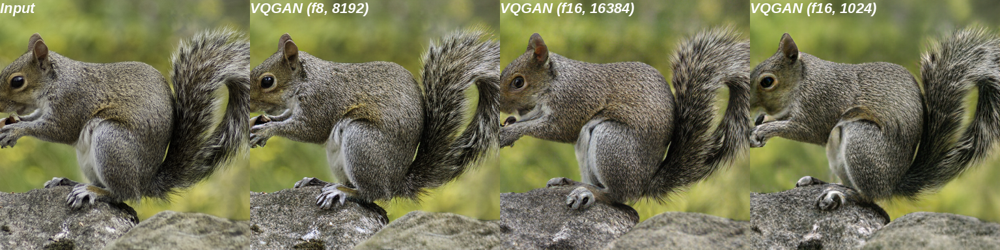

In [50]:
reconstruction_pipeline2(input_img="/content/taming-transformers/test_img_1.png", size=384)

## Single Reconstruction

In [ ]:
config32x32 = load_config("logs/vqgan_gumbel_f8/configs/model.yaml", display=False)
model32x32 = load_vqgan(config32x32, ckpt_path="logs/vqgan_gumbel_f8/checkpoints/last.ckpt", is_gumbel=True).to(DEVICE)

In [81]:
def preprocess_vqgan2(x):
  x = 2.*x - 1.
  return x


def reconstruct_with_vqgan2(x, model):
  # could also use model(x) for reconstruction but use explicit encoding and decoding here
  z, _, [_, _, indices] = model.encode(x)
  print(f"VQGAN --- {model.__class__.__name__}: latent shape: {z.shape[2:]}")
  print(x.shape, z.shape, indices.shape)
  print(indices)
  xrec = model.decode(z)
  return xrec


def reconstruct_with_vqgan3(x, model):
  # could also use model(x) for reconstruction but use explicit encoding and decoding here
  z, _, [_, _, indices] = model.encode(x)
  print(f"VQGAN --- {model.__class__.__name__}: latent shape: {z.shape[2:]}")
  print(x.shape, z.shape, indices.shape)
  print(indices)

  z_courrption = torch.randn_like(z)
  z -= z_courrption

#   print(torch.max(z), torch.min(z))

  xrec = model.decode(z)
  return xrec


VQGAN --- GumbelVQ: latent shape: torch.Size([48, 48])
torch.Size([1, 3, 384, 384]) torch.Size([1, 256, 48, 48]) torch.Size([1, 48, 48])
tensor([[[3608, 7689, 1320,  ..., 7679, 1895, 2239],
         [5144, 2129, 2410,  ..., 6431, 6215, 1939],
         [1025, 3387, 1051,  ..., 1300, 2880, 1596],
         ...,
         [3789, 3198, 6137,  ..., 4365, 4063, 1229],
         [7276, 2577, 4068,  ..., 2665,  954, 6902],
         [7360, 7276,  784,  ..., 2035, 3396, 3424]]], device='cuda:0')


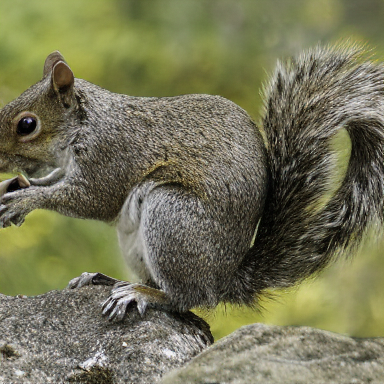

In [83]:
input_img="/content/taming-transformers/test_img_1.png"
input_img = Image.open(input_img)
target_image_size = 384
x_vqgan = preprocess(input_img, target_image_size=target_image_size, map_dalle=False)
x_vqgan = x_vqgan.to(DEVICE)

# 8x spatial dimension reduction log_2(8) times divide h, w by 2.
# x0 = reconstruct_with_vqgan3(preprocess_vqgan2(x_vqgan), model32x32)
x0 = reconstruct_with_vqgan2(preprocess_vqgan2(x_vqgan), model32x32)
w, h = target_image_size, target_image_size

x0 = custom_to_pil(x0[0])
# x0 = custom_to_pil(x0[0])
img = Image.new("RGB", (w, h))
img.paste(x0, (0,0))

display(img)

VQGAN --- GumbelVQ: latent shape: torch.Size([64, 64])
torch.Size([1, 3, 512, 512]) torch.Size([1, 256, 64, 64]) torch.Size([1, 64, 64])
tensor([[[3608, 6561, 6721,  ..., 6753, 1895, 5468],
         [7607, 7862, 6561,  ..., 7335, 2970, 2642],
         [2410, 4081,  235,  ..., 7689, 3569, 6167],
         ...,
         [3623, 2085, 2113,  ...,  276, 6191, 1357],
         [3086, 5627, 3981,  ..., 3199, 4471, 7503],
         [ 794, 3029,  145,  ..., 4452, 4046, 4108]]], device='cuda:0')


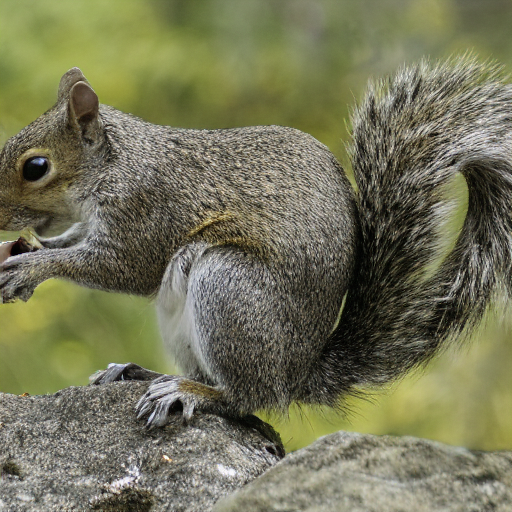

In [71]:
input_img="/content/taming-transformers/test_img_1.png"
input_img = Image.open(input_img)
target_image_size = 512
x_vqgan = preprocess(input_img, target_image_size=target_image_size, map_dalle=False)
x_vqgan = x_vqgan.to(DEVICE)

# 8x spatial dimension reduction log_2(8) times divide h, w by 2.
x0 = reconstruct_with_vqgan2(preprocess_vqgan2(x_vqgan), model32x32)
w, h = target_image_size, target_image_size

x0 = custom_to_pil(x0[0])

img = Image.new("RGB", (w, h))
img.paste(x0, (0,0))

display(img)

## All Reconstruction

input is of size: torch.Size([1, 3, 384, 384])
VQGAN --- GumbelVQ: latent shape: torch.Size([48, 48])
VQGAN --- VQModel: latent shape: torch.Size([24, 24])
VQGAN --- VQModel: latent shape: torch.Size([24, 24])
DALL-E: latent shape: torch.Size([1, 48, 48])


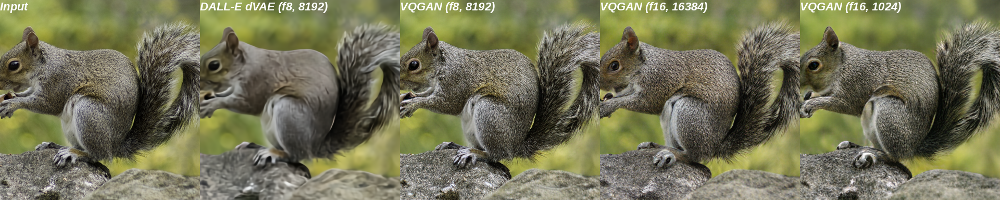

In [24]:
reconstruction_pipeline(url='https://heibox.uni-heidelberg.de/f/7bb608381aae4539ba7a/?dl=1', size=384)

input is of size: torch.Size([1, 3, 384, 384])
VQGAN --- GumbelVQ: latent shape: torch.Size([48, 48])
VQGAN --- VQModel: latent shape: torch.Size([24, 24])
VQGAN --- VQModel: latent shape: torch.Size([24, 24])
DALL-E: latent shape: torch.Size([1, 48, 48])


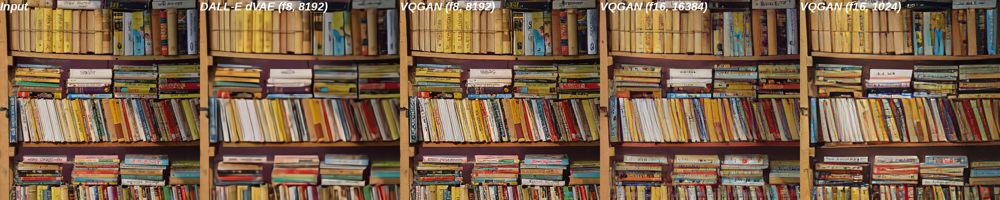

In [25]:
reconstruction_pipeline(url='https://heibox.uni-heidelberg.de/f/6f12b330eb564d288d76/?dl=1', size=384)

input is of size: torch.Size([1, 3, 384, 384])
VQGAN --- GumbelVQ: latent shape: torch.Size([48, 48])
VQGAN --- VQModel: latent shape: torch.Size([24, 24])
VQGAN --- VQModel: latent shape: torch.Size([24, 24])
DALL-E: latent shape: torch.Size([1, 48, 48])


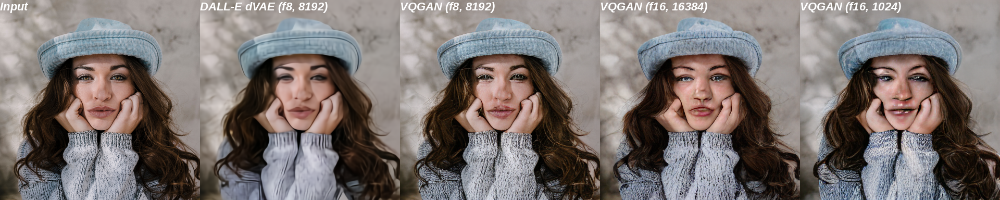

In [26]:
reconstruction_pipeline(url='https://heibox.uni-heidelberg.de/f/be6f4ff34e1544109563/?dl=1', size=384)

input is of size: torch.Size([1, 3, 384, 384])
VQGAN --- GumbelVQ: latent shape: torch.Size([48, 48])
VQGAN --- VQModel: latent shape: torch.Size([24, 24])
VQGAN --- VQModel: latent shape: torch.Size([24, 24])
DALL-E: latent shape: torch.Size([1, 48, 48])


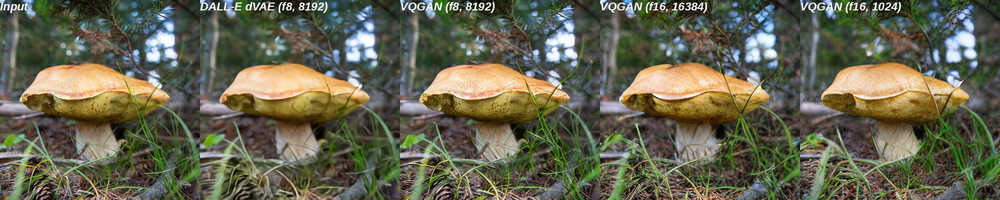

In [27]:
reconstruction_pipeline(url='https://heibox.uni-heidelberg.de/f/8555a959b0a5423cbfd1/?dl=1', size=384)

input is of size: torch.Size([1, 3, 320, 320])
VQGAN --- GumbelVQ: latent shape: torch.Size([40, 40])
VQGAN --- VQModel: latent shape: torch.Size([20, 20])
VQGAN --- VQModel: latent shape: torch.Size([20, 20])
DALL-E: latent shape: torch.Size([1, 40, 40])


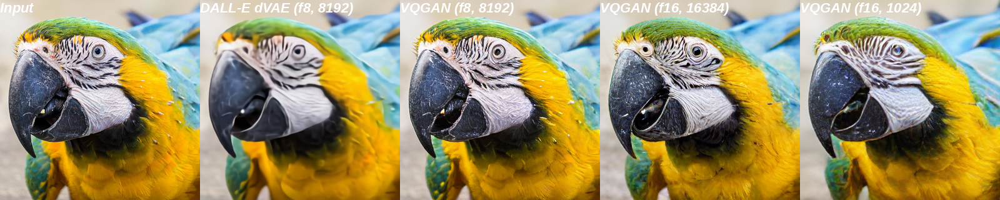

input is of size: torch.Size([1, 3, 512, 512])
VQGAN --- GumbelVQ: latent shape: torch.Size([64, 64])
VQGAN --- VQModel: latent shape: torch.Size([32, 32])
VQGAN --- VQModel: latent shape: torch.Size([32, 32])
DALL-E: latent shape: torch.Size([1, 64, 64])


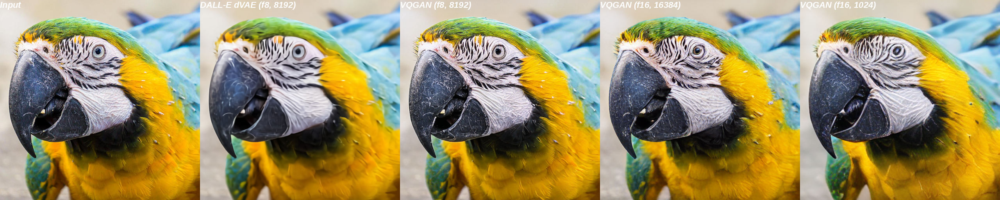

In [28]:
display(reconstruction_pipeline("https://heibox.uni-heidelberg.de/f/5cfd15de5d104d6fbce4/?dl=1", size=320))
display(reconstruction_pipeline("https://heibox.uni-heidelberg.de/f/5cfd15de5d104d6fbce4/?dl=1", size=512))